# Introduction to Spatial Mapping and Remote Sensing for Ecology
### A guide to spatial mapping and remote sensing using R

---

> *"The map is not the territory."*
— Alfred Korzybski

---

## Introduction

Welcome to the spatial mapping and remote sensing series. The first section (R Fundamentals) taught you how to work as a data analyst in R: the basics of the language and the RStudio environment (Part 1), the manipulation of tidy data with the `tidyverse` (Part 2), the grammar of graphics with `ggplot2` (Part 3). From this point onward, our subject changes. We move from generic data analysis to the explicitly geographical and ecological: the science of *where* things live, *how* environments vary across space, and *what* satellites orbiting hundreds of kilometres above us can tell us about life on Earth.

This page contains no R code. It is a conceptual map of the areas we are about to explore. Subsequent pages (Part 2 onward) will load the `sf`, `terra`, `stars`, `tmap`, and `ggspatial` packages and begin the technical work of reading, transforming, analysing, and visualising spatial data. Before we get to that, however, you need to understand what spatial ecology *is*, why it matters for the biodiversity crisis of the twenty-first century, what kinds of data exist, and how a satellite turns reflected sunlight into a number you can analyse. The maps shown throughout this page were produced by myself as showcase examples of some of the maps you should be able to make after this series.

---

## What is Spatial Analysis and Spatial Ecology?

**Spatial analysis** is the family of techniques used to study phenomena whose properties depend on, or are organised by, their location in space. It encompasses the description of spatial patterns (where are things?), the testing of hypotheses about those patterns (are they clustered, dispersed, or random?), and the modelling of processes that generate them (what causes the pattern?). **Spatial ecology**, on the other hand, is the application of these techniques to ecological questions: the distribution and abundance of organisms, the structure of habitats, the movement of individuals, the connectivity of populations, and the flow of energy and matter through landscapes and seascapes (Fortin and Dale, 2005; Wegmann et al., 2016).

Although ecology has always been concerned with place (Darwin's *Voyage of the Beagle* is fundamentally a spatial document), the formal incorporation of geographical concepts into ecological theory is more recent. The discipline now recognises that almost every ecological process plays out across heterogeneous space and that ignoring this heterogeneity introduces serious bias. Two organisms sampled one metre apart are not statistically independent; neither are two pixels of a satellite image. Recognising spatial structure is therefore not a stylistic preference but a prerequisite for valid inference (Legendre, 1993; Dormann et al., 2007).

### Tobler's First Law of Geography

The intuition that proximity matters was crystallised by Waldo Tobler in 1970 in a paper describing a computer simulation of urban growth in Detroit. To justify a simplification in his model, Tobler invoked what he called "the first law of geography": *everything is related to everything else, but near things are more related than distant things* (Tobler, 1970). Although Tobler was not entirely serious in elevating this observation to the status of a law, the phrase has become foundational. It highlights spatial autocorrelation statistics, geostatistical interpolation methods such as kriging, inverse distance weighting, and most modern species distribution models. For the ecologist, Tobler's law captures an inescapable fact: a temperature reading, a soil sample, or a species occurrence is profoundly informative about its immediate neighbourhood and progressively less informative further away.

### A Brief History: From Humboldt to the Cloud

Spatial thinking in the life sciences is older than the satellite era. Alexander von Humboldt, on his Andean expeditions with Aimé Bonpland in the early nineteenth century, produced the *Tableau Physique* of Mount Chimborazo, a cross-section of the volcano showing how plant communities are stratified by altitude and climate (Humboldt and Bonpland, 1807). This was arguably the first quantitative biogeographic profile and the conceptual ancestor of every elevation gradient study since.

In London in 1854, the physician John Snow mapped the addresses of cholera fatalities in Soho, demonstrating that deaths clustered around the Broad Street water pump and providing decisive evidence for waterborne (rather than miasmatic) transmission of disease (Snow, 1855). Snow's map is now an icon of epidemiology, public health, and spatial reasoning, even if the details of its historical role are more nuanced than the popular legend suggests. A century later, Robert MacArthur and Edward O. Wilson formalised the spatial logic of biodiversity in *The Theory of Island Biogeography* (1967), demonstrating that species richness on islands is a predictable function of island area and isolation. Their equilibrium theory remains the conceptual scaffold for the design of nature reserves and for our understanding of habitat fragmentation.

The late twentieth century brought the digital revolution: Geographic Information Systems (GIS) emerged in the 1960s and 1970s with pioneers such as Roger Tomlinson and the Harvard Laboratory for Computer Graphics; the first Earth-observation satellite for civilian use, ERTS-1 (later renamed Landsat 1), was launched by NASA in 1972, beginning a continuous archive of the Earth's land surface that is now over five decades long (Wulder et al., 2022). Today, the field has moved into the cloud: petabyte-scale archives such as Google Earth Engine, the Microsoft Planetary Computer, and AWS Open Data make the entire Landsat and Sentinel record analysable from a laptop (Gorelick et al., 2017).

### Why Ecology is Inherently Spatial

Organisms occupy space, compete for it, disperse through it, and are shaped by environmental gradients distributed across it. Climate, topography, soil, hydrology, and disturbance regimes all vary geographically and structure the assemblages that ecologists study. Spatial position determines what a population experiences and which other populations it can exchange genes with. A non-spatial ecology, in which all individuals are treated as interchangeable points in an abstract niche space, will systematically misrepresent the dynamics of real ecosystems (Levin, 1992; Tilman and Kareiva, 1997).

### Scales of Analysis

Ecological questions are scale-dependent, and choosing the wrong scale can render a study uninformative or misleading. The *grain* (the resolution of measurement, for example a 10 m Sentinel-2 pixel) and the *extent* (the total area covered, for example the Cape Floristic Region) jointly define what can be inferred. Conventionally, ecologists distinguish:

- **Local scale** (metres to hectares): individual movement, microhabitat selection, plant-pollinator interactions.
- **Landscape scale** (kilometres to tens of kilometres): patch dynamics, corridor function, metapopulation processes.
- **Regional scale** (hundreds of kilometres): biogeographic provinces, beta diversity, climate gradients.
- **Global scale** (continents and oceans): biome distributions, planetary biogeochemistry, climate-biodiversity feedbacks.

A satellite product useful at one scale may be invisible at another: 30 m Landsat data can resolve a forest clearing but not an individual tree, whereas 250 m MODIS imagery captures continental phenology but blurs every field boundary. Throughout this block, you will learn to match data, methods, and questions to scales appropriately.

---

## Why Spatial Ecology Matters: Real-World Applications

Spatial methods are no longer optional for the working ecologist. They are central to nearly every contemporary applied question in conservation biology, environmental management, and global change science.

### 1. Conservation Planning and Protected Area Design

Systematic conservation planning, formalised by Margules and Pressey (2000), uses spatial optimisation algorithms (such as those implemented in Marxan and `prioritizr`) to design networks of protected areas that maximise biodiversity representation while minimising socioeconomic cost. The Kunming-Montreal Global Biodiversity Framework (KMGBF), adopted under the Convention on Biological Diversity in December 2022, includes the well-known "30 by 30" target of conserving 30% of land and ocean by 2030; meeting it without spatial analysis is impossible (Convention on Biological Diversity, 2022; Cavender-Bares et al., 2022).

### 2. Species Distribution Modelling and Climate Projections

Species distribution models (SDMs) correlate occurrence records with environmental predictors to estimate habitat suitability across space and project it under future climates (Elith and Leathwick, 2009; Zurell et al., 2020). Modern SDMs increasingly incorporate raw satellite imagery and time series via deep learning, capturing seasonal and structural cues that bioclimatic averages miss (Dollinger et al., 2024). These models inform IUCN Red List assessments, climate-adaptation planning for endangered species, and the identification of climate refugia.

### 3. Disease Ecology

The spatial mapping of disease vectors and hosts is now indispensable. The Malaria Atlas Project produces global, high-resolution surfaces of *Plasmodium falciparum* prevalence by combining household surveys with environmental covariates (Weiss et al., 2019). Similar approaches map *Ixodes* tick habitat for Lyme disease in Europe and North America, dengue and Zika risk in the tropics, and the geography of zoonotic spillover. Snow's 1854 cholera map has direct intellectual descendants in every contemporary epidemiological dashboard.

### 4. Invasive Species Management

Remote sensing combined with SDMs predicts where alien species are most likely to establish, allowing managers to allocate scarce surveillance and eradication resources. Recent work has mapped the expansion of *Lantana camara* across African savannas using fused satellite and field data (Saranya et al., 2024), and similar pipelines now monitor *Acacia* invasions in the Cape, *Prosopis* in East Africa, and *Caulerpa* in the Mediterranean.

### 5. Marine Spatial Planning and MPA Design

Marine protected area (MPA) networks rely on spatial analyses of habitat, productivity, connectivity, and human pressure. Sea surface temperature, chlorophyll-*a* concentration, bathymetry, and modelled larval dispersal are routinely combined to identify priority sites, evaluate representativeness, and forecast climate-driven shifts in species ranges (Lubchenco and Grorud-Colvert, 2015).

### 6. Habitat Connectivity and Corridor Design

Landscape genetics and circuit theory (McRae et al., 2008) translate maps of land cover into maps of resistance to movement, allowing the identification of corridors that maintain gene flow between fragmented populations. The Yellowstone-to-Yukon initiative and similar continental-scale connectivity projects depend entirely on such spatial modelling.

### 7. Ecosystem Services Valuation

Biophysical and economic valuation of services such as carbon storage, pollination, water provision, and coastal protection requires their explicit mapping. Tools such as InVEST and ARIES map service supply, demand, and beneficiaries to inform land-use decisions and payment-for-ecosystem-services schemes.

### 8. Land-Use Change and Deforestation Monitoring

The Hansen Global Forest Change dataset, derived from time-series analysis of Landsat imagery and now extending from 2000 to 2024 in version 1.12, provides the world's standard reference for tropical and global forest loss (Hansen et al., 2013). It is used by national REDD+ programmes, by Global Forest Watch, and by court-admissible deforestation tracking under the EU Deforestation Regulation. A 2025 analysis using the same data found that forest disturbance from fire reached unprecedented levels in 2023 and 2024, with the largest increases in intact forest landscapes (Potapov et al., 2025).

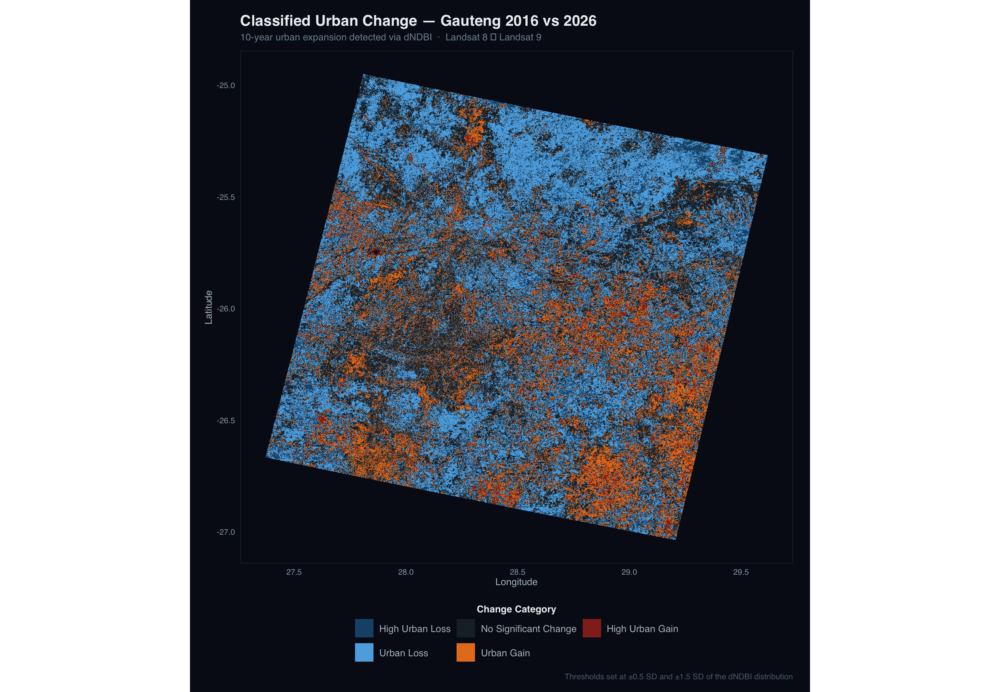

### 9. Wildlife Trafficking and Anti-Poaching

Spatial intelligence highlights modern anti-poaching: predictive policing models built on past poaching incidents direct ranger patrols (the SMART system); satellite radar detects illegal fishing vessels (Global Fishing Watch); and isotopic plus genetic forensics, mapped spatially, trace ivory shipments back to source populations.

### 10. Climate Change Impacts on Biodiversity

From poleward and uphill range shifts (Chen et al., 2011), to coral-bleaching forecasts driven by NOAA's satellite SST products, to phenological mismatch in temperate forests, the empirical study of climate impacts on biodiversity is overwhelmingly spatial. The integration of remote sensing with ecology, as articulated by Cavender-Bares et al. (2022), is now indispensable for tracking the Essential Biodiversity Variables that support global monitoring.

---

## Spatial Data: The Two Worlds

Spatial data come in two fundamental flavours, each suited to different kinds of phenomena. Mastery of the distinction, and of the conversions between them, is the central technical skill of this block.

### Vector Data: Discrete Features

**Vector data** represent discrete spatial features as geometries: *points* (zero-dimensional), *lines* (one-dimensional), and *polygons* (two-dimensional). Each feature carries an attribute table linking it to descriptive variables.

- *Points* might represent species occurrences from GBIF, the locations of camera traps, GPS fixes from a tracked elephant, or weather stations.
- *Lines* commonly represent rivers, roads, transects walked by field surveyors, or migration tracks.
- *Polygons* delineate countries, protected areas, vegetation patches, or species range maps.

Vector data are the natural representation for things with sharp boundaries. The international standard for representing them is the Open Geospatial Consortium's Simple Features specification (ISO 19125), which `sf` implements directly in R (Pebesma, 2018; Pebesma and Bivand, 2023).

### Raster Data: Continuous Surfaces

**Raster data** represent space as a regular grid of cells (pixels), each holding one or more numerical values. Rasters are the natural representation for continuously varying phenomena.

- A *digital elevation model* (DEM) records altitude at every cell.
- A *sea surface temperature* grid records degrees Celsius over the ocean, daily.
- A *land cover* map assigns each pixel to a categorical class (e.g., the eleven classes of ESA WorldCover).
- A *Sentinel-2 scene* records reflectance in thirteen spectral bands at 10 to 60 m resolution.

A multi-band or multi-date raster naturally extends to a *data cube*, a three- or four-dimensional array indexed by space, time, and band. Modern packages such as `terra` and `stars` support this view directly (Pebesma and Bivand, 2023).

![Figure 2: Hill-shaded South Africa with rivers, AWS Terrain Tiles SRTM. This relief map portrays the topography of South Africa derived from Shuttle Radar Topography Mission (SRTM) elevation data, served as cloud-optimised Mapzen Terrain Tiles via AWS Open Data and processed in R.](attachment:45e1546d-53d3-4344-a2ed-d9313a993c56.png)

### Coordinate Reference Systems: Why Latitude and Longitude Are Not Enough

Every spatial dataset must be tagged with a **coordinate reference system** (CRS) that specifies how its numerical coordinates relate to positions on the real Earth. A CRS has three ingredients: a *datum* (a model of the Earth's shape, most commonly the WGS84 ellipsoid used by GPS); a *coordinate system* (geographic in degrees of latitude and longitude, or projected in metres on a flat plane); and, for projected systems, a *projection* (the mathematical transformation from sphere to plane). Each known CRS is identified by an EPSG code: 4326 for WGS84 geographic coordinates, 3857 for the Web Mercator used by Google Maps, 3035 for ETRS89 / LAEA Europe, and so on.

Mismatched CRSs are the single most common source of bugs in spatial analysis. If you overlay a raster in WGS84 on a polygon in UTM, your software will plot them in the same window but they will not align in any meaningful sense; any spatial join will fail. Modern R-spatial packages handle reprojection through the PROJ library, but the user must remain aware of which CRS is in use.

### Map Projections and Their Distortions

The Earth is (very nearly) an oblate spheroid; a flat map necessarily distorts it. Every projection preserves some properties at the expense of others.

- The **Mercator projection** (1569) preserves angles, making it useful for navigation but grotesquely inflating the polar regions. On a Mercator map, Greenland appears comparable in size to Africa, even though Africa is roughly fourteen times larger. For ecological mapping at global scales, Mercator is almost always the wrong choice.
- The **Robinson projection** is a compromise that distorts both area and angle modestly, producing visually pleasing world maps suitable for thematic display.
- The **Mollweide** and **Eckert IV** projections are equal-area, preserving the relative sizes of regions, which is essential for any choropleth where area is part of the message.
- **Albers Equal-Area Conic** is the standard for continental-scale maps (such as the contiguous United States or southern Africa) where minimising area distortion matters.
- **Universal Transverse Mercator (UTM)** divides the world into 6-degree zones, each with low local distortion, and is the workhorse for fieldwork and high-resolution analysis.
- **Orthographic** projections show the Earth as it appears from space, useful for visualising hemispheric phenomena such as Pacific tectonics or polar sea ice.

Choosing a projection is therefore an ecological as well as an aesthetic decision. A global biodiversity choropleth on a Mercator base will visually exaggerate boreal countries and trivialise the tropics; an equal-area projection corrects this.

---

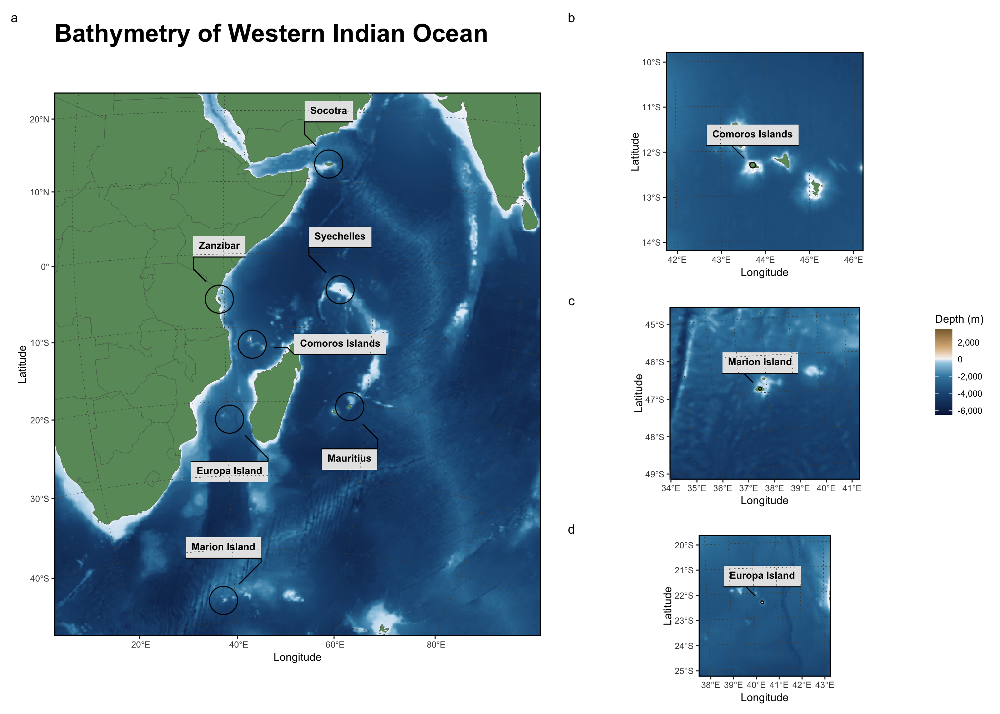

---

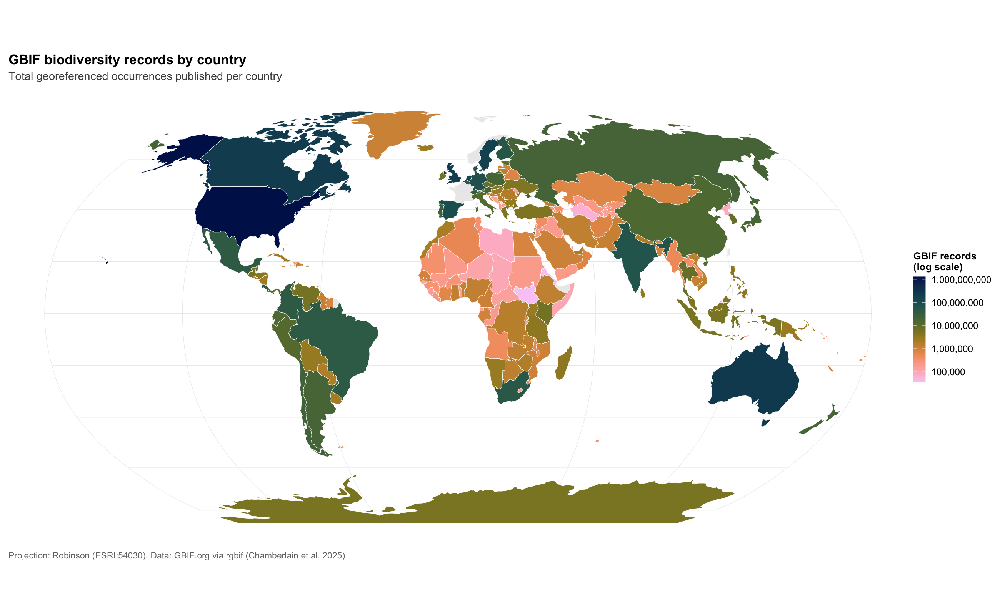

---

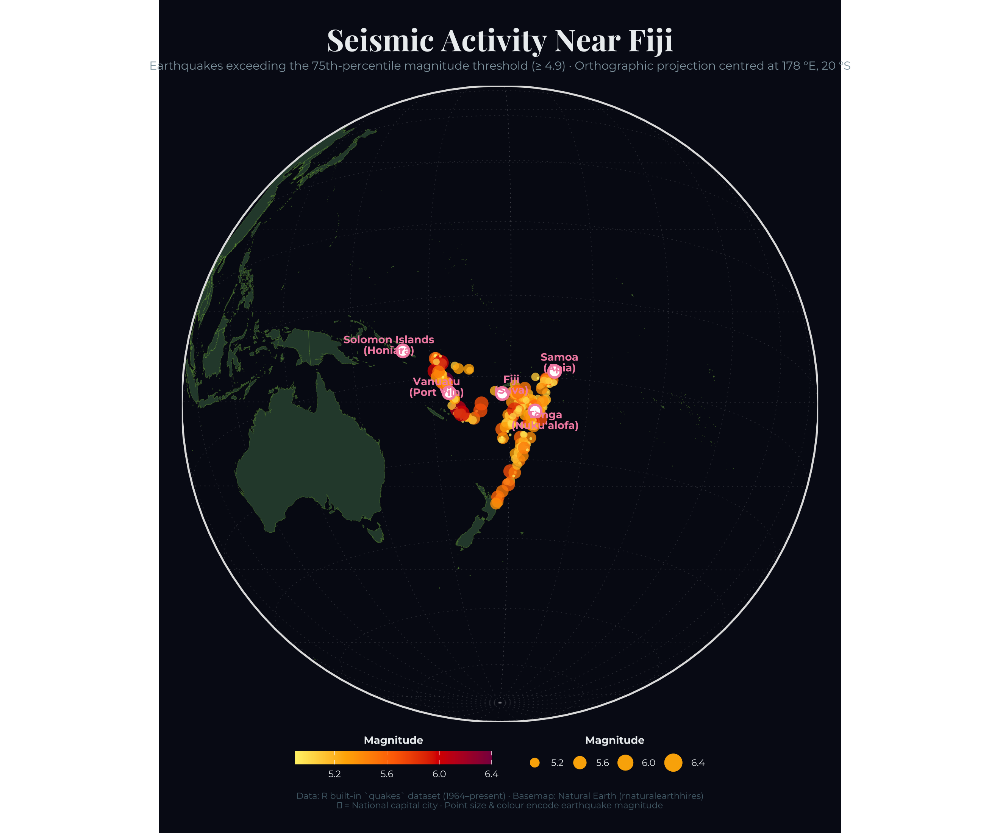

---
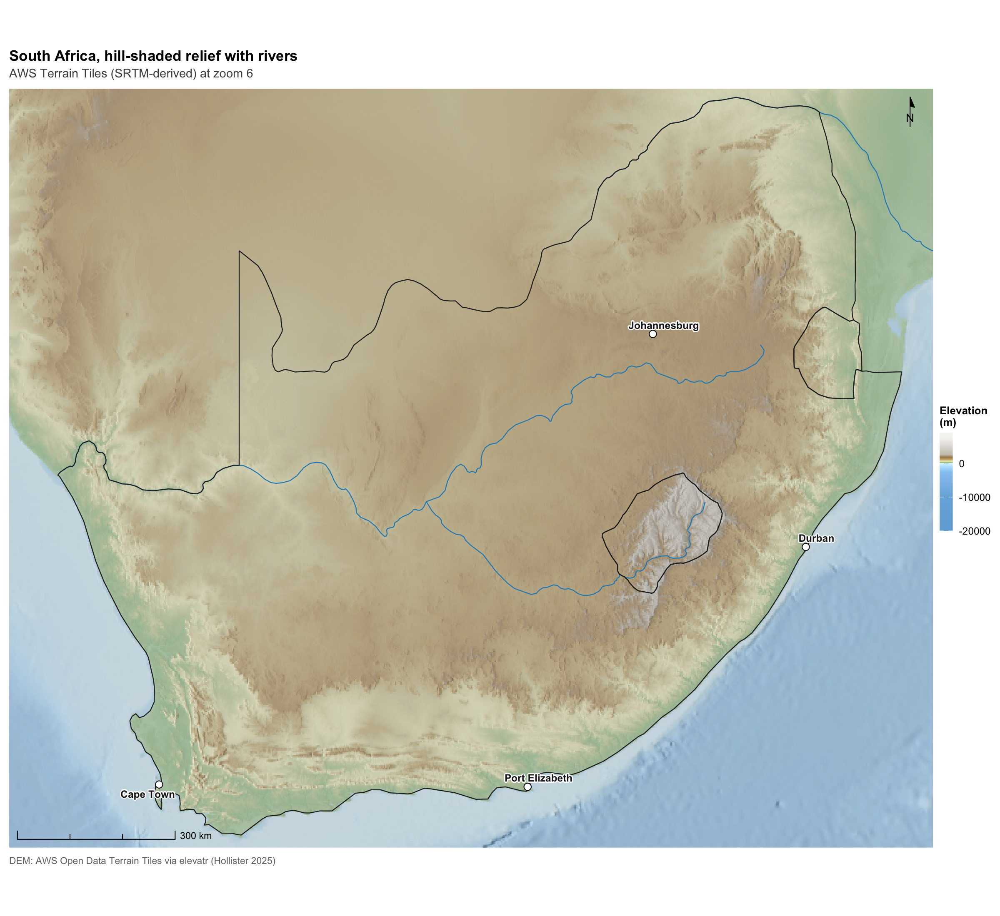

---

## How Spatial Analysis is Done in R

### A Brief History of R-Spatial

R has been used for spatial analysis since the early 2000s, but the toolchain has changed dramatically. The first generation, built around the `sp` package (Pebesma and Bivand, 2005) for vector data and the `raster` package (Hijmans, 2010) for raster data, dominated the discipline for over a decade. Two companion packages, `rgdal` (interface to GDAL and PROJ) and `rgeos` (interface to GEOS), provided the link to the underlying open-source geospatial C++ libraries; a third, `maptools`, supplied legacy utilities.

The second generation began with `sf` in 2016, which implemented the OGC Simple Features standard natively in R using modern data structures (tibbles with list columns of geometries) and direct linkage to GDAL, GEOS, and PROJ (Pebesma, 2018). It was followed by `stars` (2018) for raster and vector data cubes, and by `terra` (2020), Robert Hijmans's successor to `raster`, with its own direct C++ bindings to the same geospatial stack (Pebesma and Bivand, 2023; Hijmans, 2023).

### The Retirement of rgdal, rgeos, and maptools

On 16 October 2023, the legacy packages `rgdal`, `rgeos`, `maptools`, and `rgrass7` were archived on CRAN, marking the formal end of the first-generation R-spatial toolchain (Bivand, 2023). The retirement was anticipated for years, was coordinated by the R Consortium's R-Spatial Evolution project, and reflects two converging realities: the maintainer, Roger Bivand, retired from active development; and the modern packages had reached parity and superseded the legacy ones. You, however, are fortunate: you will learn the modern stack from the start and will not need to translate between two paradigms. Older textbooks, blog posts, and Stack Overflow answers that load `rgdal` or `rgeos` should now be treated as historical documents.

### The Modern Toolkit

The packages you will encounter in this block are:

- **`sf`** (Simple Features) for vector data: points, lines, polygons, and their attributes, all stored in a tidy data frame with a geometry column. Reads and writes shapefiles, GeoPackages, GeoJSON, and many other formats through GDAL.
- **`terra`** for raster data and lighter-weight vector data, optimised for speed and memory efficiency on very large grids. The natural successor to `raster`.
- **`stars`** for spatiotemporal arrays and data cubes, including curvilinear and rotated grids that arise in climate model output.
- **`ggplot2`** with `geom_sf()` for static maps in the grammar of graphics.
- **`tmap`** for thematic mapping in a layered, ggplot-like syntax with strong defaults for both static and interactive output (Tennekes, 2018).
- **`ggspatial`** for adding north arrows, scale bars, and tile basemaps to ggplot2 maps.
- **`leaflet`** for interactive web maps embedded in R Markdown or Shiny.
- Helper packages such as `rnaturalearth` (country and ocean polygons), `rgbif` (GBIF occurrences), `elevatr` (DEMs), `rstac` (SpatioTemporal Asset Catalogues), and `gdalcubes` (analysis-ready data cubes from satellite imagery).

### Why R Rather Than ArcGIS or QGIS?

Desktop GIS software (ArcGIS Pro, QGIS) excels at point-and-click cartography and is widely used in industry. R offers complementary strengths that matter especially in research:

- **Reproducibility**. A script encodes every step from raw data to final figure, can be re-run by anyone (including the author six months later), and can be version-controlled with Git.
- **Integration with statistics**. R is a statistical language first. Spatial data flow seamlessly into mixed models, machine learning pipelines, Bayesian inference, and time-series analyses without leaving the environment.
- **Automation**. Producing one map for one country is easy in any GIS; producing the same map for all 195 countries is trivial in R and tedious by point-and-click.
- **Open-source transparency**. Every algorithm is inspectable, citable, and free. There are no licence dongles standing between you and your data.
- **Community and longevity**. The CRAN Task View on Analysis of Spatial Data lists hundreds of curated packages spanning point-pattern analysis, geostatistics, areal regression, and ecological niche modelling.

For ecological research, the consensus of the field, articulated in successive editions of Lovelace, Nowosad, and Muenchow's *Geocomputation with R* (2025) and Pebesma and Bivand's *Spatial Data Science* (2023), is that R is the best general-purpose environment.

### The OGC Simple Features Standard and the GDAL/GEOS/PROJ Stack

Underneath the R packages lies a foundation of open-source C/C++ libraries shared across the geospatial world (used also by QGIS, PostGIS, GeoPandas in Python, and many commercial products). Three are essential:

- **GDAL** (Geospatial Data Abstraction Library) reads and writes hundreds of vector and raster formats and handles reprojection.
- **GEOS** (Geometry Engine, Open Source) computes geometric predicates and operations: intersections, unions, buffers, distances.
- **PROJ** maintains a database of coordinate reference systems and the transformations between them.

The Open Geospatial Consortium's **Simple Features** specification, formalised as ISO 19125, defines a small set of geometry types (POINT, LINESTRING, POLYGON, and their MULTI- variants) and a vocabulary of operations on them. `sf` implements this standard in R, ensuring that data and methods written in R are interoperable with PostGIS databases, ArcGIS, QGIS, and GeoPandas.

---

## What is Remote Sensing?

### Definition and Conceptual Basis

**Remote sensing** is the acquisition of information about an object or phenomenon without making physical contact with it. In Earth observation, this almost always means measuring electromagnetic radiation (reflected sunlight, emitted thermal radiation, or returned radar pulses) from instruments on satellites, aircraft, or drones. The information content of a measurement depends on how the target interacts with radiation at different wavelengths: chlorophyll absorbs red light, water absorbs near-infrared, snow reflects almost everything in the visible spectrum, and burnt vegetation has a distinctive shortwave-infrared signature.

Two fundamental classes of sensor exist. **Passive sensors** detect natural radiation, principally reflected solar radiation (in the visible, near-infrared, and shortwave infrared) and emitted thermal radiation (in the thermal infrared). They depend on the sun and cannot see through cloud at most wavelengths. Examples include Landsat's Operational Land Imager and Sentinel-2's MultiSpectral Instrument. **Active sensors** emit their own radiation and measure the return: synthetic aperture radar (Sentinel-1, ALOS PALSAR), lidar (ICESat-2, GEDI), and altimeters (Sentinel-3, SWOT). They work day and night and, at radar wavelengths, see through cloud.

### A Brief History of Earth Observation

Civilian satellite remote sensing began with the launch of ERTS-1 (Landsat 1) on 23 July 1972. The Landsat programme has continued without interruption ever since, with Landsat 9 (launched September 2021) and Landsat 8 (launched 2013) currently operational at 30 m resolution and a 16-day revisit (Wulder et al., 2022). The European Space Agency's Copernicus programme, launched in the mid-2010s, added a constellation of Sentinel satellites with open data policies that catalysed a global community of users. Sentinel-2A (2015) and Sentinel-2B (2017) deliver 10 to 20 m optical imagery; Sentinel-2C, launched 5 September 2024, replaced Sentinel-2A in primary operations on 21 January 2025, and Sentinel-2D will succeed Sentinel-2B in due course (ESA, 2025). NASA's Harmonised Landsat and Sentinel-2 (HLS) project now combines the two missions into a virtual constellation with a global revisit of better than 1.4 days (NASA, 2025). The era of "every place, every few days" is here.

### Key Satellite Missions and Their Resolutions

Four kinds of resolution characterise any sensor and must be considered jointly:

- **Spatial resolution**: the size of one pixel on the ground. Examples: Sentinel-2 at 10 m for visible and near-infrared bands, Landsat at 30 m, MODIS at 250 m to 1 km, and the NOAA OISST product at 25 km.
- **Temporal resolution** (revisit time): how often the satellite returns to the same place. Examples: MODIS daily, Sentinel-2 every 5 days, Landsat every 16 days.
- **Spectral resolution**: the number and width of wavelength bands measured. A natural-colour camera has 3 bands (RGB); Sentinel-2 has 13; hyperspectral sensors such as PRISMA, EnMAP, and the planned NASA SBG mission have hundreds.
- **Radiometric resolution**: how finely the signal is digitised, expressed in bits. Landsat 8 records 12-bit data (4,096 levels); older sensors offered 8-bit (256 levels).

There is no free lunch: high spatial resolution is usually traded against low temporal resolution and limited spectral coverage. The art of remote sensing is choosing the right instrument for the question.

The principal missions you will encounter are:

- **Landsat (1972 to present)**, jointly operated by NASA and the USGS, providing the longest continuous land-imaging record at 30 m.
- **Sentinel-2 (2015 to present)**, ESA's Copernicus optical mission, delivering 10–20 m imagery every 5 days globally.
- **MODIS (1999, 2002 to present)**, NASA's Moderate Resolution Imaging Spectroradiometer aboard the Terra and Aqua satellites, providing daily 250 m to 1 km imagery; succeeded by VIIRS.
- **NOAA AVHRR / OISST**, providing the longest record of sea surface temperature, used for climate science and fisheries.
- **SRTM** (Shuttle Radar Topography Mission, February 2000), **ASTER GDEM**, and the **Copernicus DEM (GLO-30)** for elevation at 30 m globally.
- **Sentinel-1** (C-band radar) for cloud-penetrating imaging.
- **GEDI and ICESat-2** for canopy-height lidar.

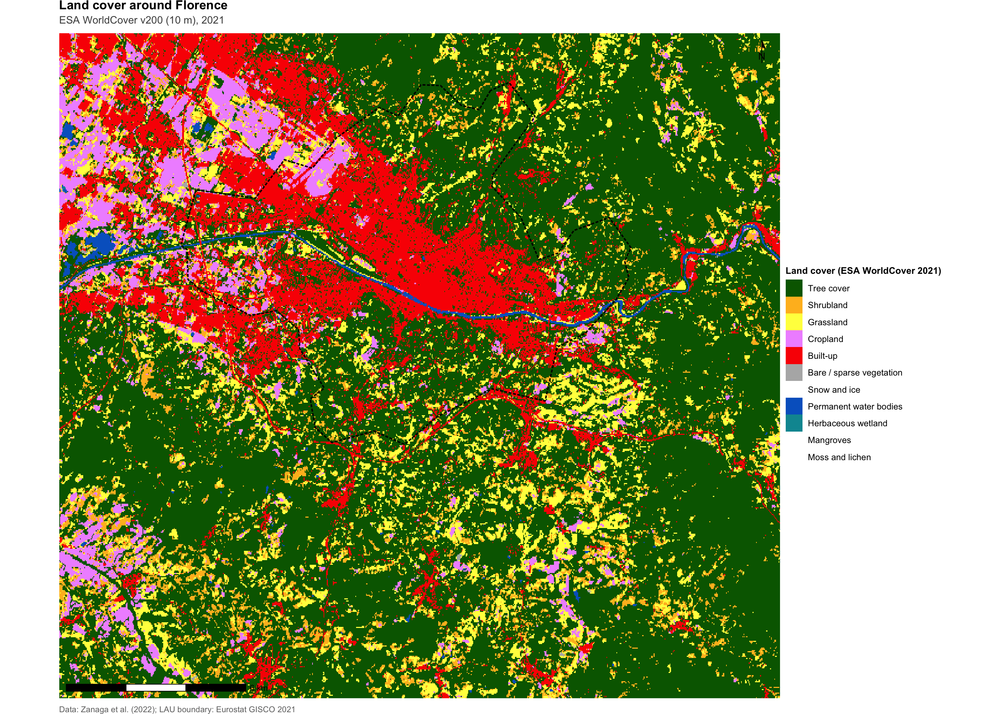

### Spectral Bands and What They Mean

Beyond the visible **red, green, and blue** (the bands we see with our eyes), the most ecologically informative bands are:

- **Near-infrared (NIR, ~700–1300 nm)**, strongly reflected by healthy leaves and the basis for vegetation indices.
- **Shortwave infrared (SWIR, ~1300–2500 nm)**, sensitive to plant water content, mineralogy, and burnt area.
- **Thermal infrared (~3000–14000 nm)**, used for land and sea surface temperature.
- **Red edge** (~700–750 nm), a transition zone exquisitely sensitive to chlorophyll status, sampled by Sentinel-2 (bands 5, 6, 7) and used for crop monitoring and species discrimination.

### Vegetation Indices

A vegetation index combines reflectance in two or more bands into a single number that emphasises a property of the vegetation. The most famous is **NDVI** = (NIR − Red) / (NIR + Red), introduced in the early 1970s (Rouse et al., 1974) and still ubiquitous (Pettorelli et al., 2005; Pettorelli, 2013). NDVI ranges from approximately −1 to +1; live, dense vegetation typically scores above 0.6, sparse vegetation around 0.2 to 0.5, and bare ground and water below 0.1. NDVI saturates over dense canopies and is sensitive to soil background and atmospheric conditions; alternatives include the **Enhanced Vegetation Index (EVI)**, which corrects for these effects, the **Soil-Adjusted Vegetation Index (SAVI)** for sparse vegetation, the **Normalised Difference Water Index (NDWI)** for moisture, and the **Normalised Difference Built-up Index (NDBI)** for urban areas. For mapping urban expansion, the difference of NDBI between two dates (dNDBI) is a robust change detector.

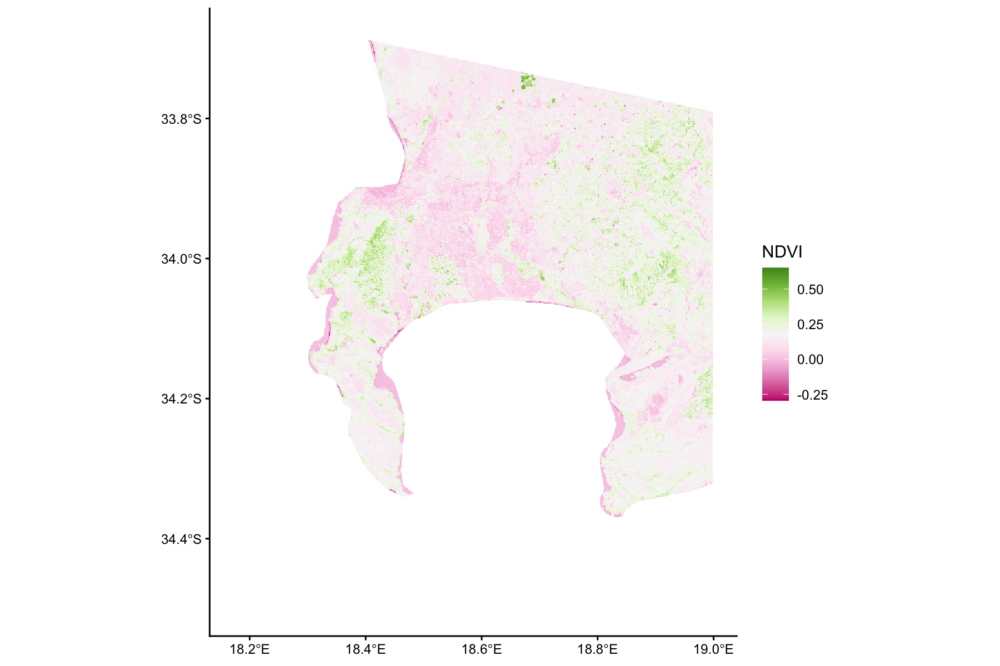

### Cloud Computing Platforms

The volume of modern Earth observation data is staggering: the Sentinel and Landsat archives jointly exceed 50 petabytes and grow by terabytes daily. No laptop can hold them, and downloading even a national-scale analysis is impractical. Modern workflow has therefore moved to the cloud:

- **Google Earth Engine** (Gorelick et al., 2017) provides a JavaScript and Python interface to a curated petabyte-scale archive with massive parallel computation. The R package `rgee` connects R users.
- **Microsoft Planetary Computer** offers a similar service with native Python and STAC APIs.
- **AWS Open Data** hosts Landsat, Sentinel, NAIP, and many other archives as Cloud Optimised GeoTIFFs that R can stream pixel by pixel via `rstac` and `gdalcubes`.
- **The Copernicus Data Space Ecosystem** provides ESA's primary public access to Sentinel data.

These platforms have democratised continental-scale remote sensing analysis, opening it to graduate students and small NGOs whose budgets would never have afforded the storage and computation a decade ago.

---

## Remote Sensing for Ecology

Beyond the obvious applications to land cover and vegetation, remote sensing now permeates virtually every subdiscipline of ecology.

### Forest Cover and Deforestation

The Hansen *et al.* (2013) Global Forest Change product, updated annually, provides 30 m global maps of tree cover in 2000, the year of any subsequent loss through 2024 (in version 1.12), and tree-cover gain. It underpins Global Forest Watch, national REDD+ Monitoring, Reporting, and Verification systems, and the EU Deforestation Regulation due-diligence requirements. Allied products from the European Commission Joint Research Centre map tropical moist forest dynamics from 1990, distinguishing degradation from outright deforestation (Vancutsem et al., 2021). Together they enable real-time monitoring of frontier deforestation in the Amazon, the Congo Basin, and Southeast Asia at scales no field campaign could ever match.

### Marine Remote Sensing

Sea surface temperature (NOAA OISST, MUR-SST), chlorophyll-*a* concentration (MODIS, OLCI on Sentinel-3), salinity (SMOS, SMAP), sea surface height (Jason, SWOT), and ocean colour generally drive marine ecology in the satellite era. They forecast harmful algal blooms, identify marine heatwaves before they bleach reefs, track the migration of pelagic predators such as bluefin tuna and white sharks, and define dynamic ocean management zones whose boundaries shift with the conditions (Lubchenco and Grorud-Colvert, 2015).

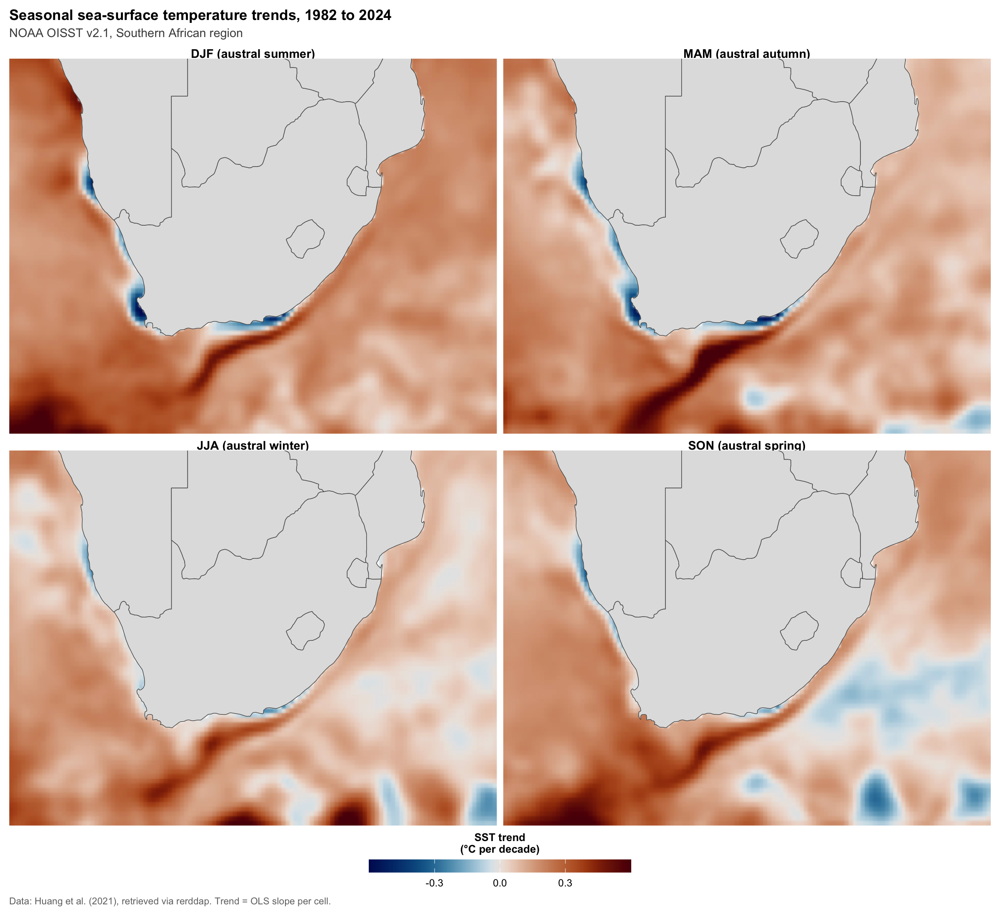

### Phenology and Time Series

Long-term satellite vegetation indices reveal the timing of green-up and senescence with unprecedented spatial detail. Phenological metrics (start of season, peak, length) extracted from MODIS or Landsat are essential for studying climate-driven shifts in growing seasons, mismatches between herbivores and forage, the timing of bird migration, and the productivity of grazing systems (Pettorelli et al., 2005; Cleland et al., 2007).

### Disturbance Detection: Fire, Flood, and Urbanisation

Burned area products (MODIS MCD64A1, Sentinel-2 FireCCI) provide near-real-time fire mapping at global scales, while change-detection algorithms such as LandTrendr, BFAST, and CCDC quantify the timing, magnitude, and duration of disturbances at the per-pixel level. The 2025 finding that global forest fire disturbance reached unprecedented levels in 2023 and 2024 (Potapov et al., 2025) is built directly on these products. Flood mapping by Sentinel-1 radar and the OPERA Dynamic Surface Water Extent product is now routine; urbanisation can be tracked at high temporal frequency by HLS data.

### Animal Tracking Integrated with Remote Sensing

Modern movement ecology, the "golden age of biologging" (Wilmers et al., 2015; Kays et al., 2015), now produces tracks of millions of GPS fixes from individual animals. Linking these tracks to time-matched remote sensing layers (NDVI for forage availability, snow cover, sea surface temperature, fire history) reveals the environmental drivers of movement at fine spatiotemporal resolution. The Movebank repository archives such datasets and provides direct integration with environmental data services. The integration of multi-species tracking with high-resolution environmental imagery is reshaping community ecology by enabling simultaneous quantification of biotic and abiotic determinants of distribution (Tuia et al., 2022; Costa-Pereira et al., 2022; Nathan et al., 2022).

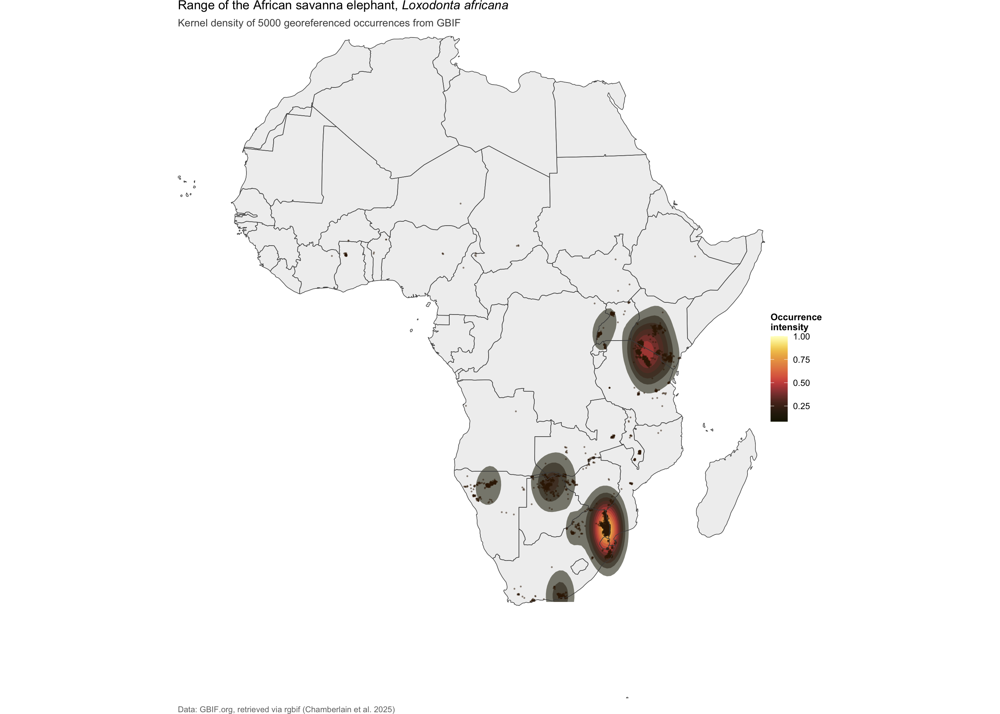

### Integration with Field Data

Remote sensing does not replace fieldwork. The most powerful inferences come from combining the two, with satellite imagery providing wall-to-wall coverage and field plots providing ground truth, validation, and the biological detail that pixels alone cannot capture. The Biodiversity Survey of the Cape (BioSCape) campaign in South Africa, which deployed NASA AVIRIS-NG hyperspectral and lidar instruments in tandem with intensive field sampling, exemplifies this paradigm and is testing the limits of what space can tell us about biodiversity (Cavender-Bares et al., 2024). The Essential Biodiversity Variables framework, developed by GEO BON, formalises which dimensions of biodiversity are best monitored by remote sensing, which by field methods, and which require both (Pereira et al., 2013; Skidmore et al., 2021; Cavender-Bares et al., 2022).

---

## What You Will Learn in This series

### The Progression of Upcoming Notebooks

Having set the stage conceptually, the rest of this block builds the practical skills, layer by layer:

- **Part 2: Vector data with `sf`.** Reading shapefiles and GeoPackages, basic geometry operations (intersect, union, buffer, distance), attribute joins, and your first `geom_sf()` maps in `ggplot2`.
- **Part 3: Raster data with `terra` and `stars`.** Loading GeoTIFFs, cropping and masking, band arithmetic, computing NDVI and other indices, basic raster algebra.
- **Part 4: Coordinate reference systems and projections.** Diagnosing CRS issues, reprojecting between systems, choosing projections for specific tasks.
- **Part 5: Cartography in R.** Producing publication-quality maps with `tmap` and `ggspatial`, scale bars and north arrows, basemap tiles, choropleths, and small multiples.
- **Part 6: Working with GBIF and species occurrences.** Querying the GBIF API with `rgbif`, cleaning records with `CoordinateCleaner`, and producing kernel density and range maps.
- **Part 7: Remote sensing in practice.** Streaming Sentinel-2 and Landsat data from STAC catalogues, computing time series, and detecting change.

### Software Stack and Skills Developed

By the end of this block, you will be fluent in `sf`, `terra`, `stars`, `ggplot2`, `tmap`, and `ggspatial`, and will be able to query cloud-hosted Earth observation archives via STAC. You will be comfortable interpreting metadata, diagnosing CRS problems, and reasoning about scale and resolution. You will know how to read a satellite image as a quantitative ecological measurement, not merely a pretty picture. You will be able to design, execute, and document a reproducible spatial analysis from raw data to final figure entirely in R. These are skills that transfer directly to graduate research, conservation NGOs, government agencies, and the private sector.

---

## References and Further Reading

### Foundational Textbooks

Pebesma, E. and Bivand, R. (2023). *Spatial Data Science: With Applications in R*. Chapman and Hall/CRC, Boca Raton. Open-access online edition at https://r-spatial.org/book/.

Lovelace, R., Nowosad, J. and Muenchow, J. (2025). *Geocomputation with R*, 2nd edn. CRC Press, Boca Raton. Open-access online edition at https://r.geocompx.org/.

Wegmann, M., Leutner, B. and Dech, S. (eds.) (2016). *Remote Sensing and GIS for Ecologists: Using Open Source Software*. Pelagic Publishing, Exeter.

Pettorelli, N. (2013). *The Normalized Difference Vegetation Index*. Oxford University Press, Oxford.

Cavender-Bares, J., Gamon, J. A. and Townsend, P. A. (eds.) (2020). *Remote Sensing of Plant Biodiversity*. Springer, Cham.

Fortin, M. J. and Dale, M. R. T. (2005). *Spatial Analysis: A Guide for Ecologists*. Cambridge University Press, Cambridge.

### Historical and Theoretical Foundations

Humboldt, A. von and Bonpland, A. (1807). *Essai sur la géographie des plantes*. Levrault, Schoell et Compagnie, Paris.

Snow, J. (1855). *On the Mode of Communication of Cholera*, 2nd edn. John Churchill, London.

MacArthur, R. H. and Wilson, E. O. (1967). *The Theory of Island Biogeography*. Princeton University Press, Princeton.

Tobler, W. R. (1970). A computer movie simulating urban growth in the Detroit region. *Economic Geography* 46(sup1): 234–240.

Levin, S. A. (1992). The problem of pattern and scale in ecology. *Ecology* 73(6): 1943–1967.

Legendre, P. (1993). Spatial autocorrelation: trouble or new paradigm? *Ecology* 74(6): 1659–1673.

Margules, C. R. and Pressey, R. L. (2000). Systematic conservation planning. *Nature* 405: 243–253.

Tilman, D. and Kareiva, P. (eds.) (1997). *Spatial Ecology: The Role of Space in Population Dynamics and Interspecific Interactions*. Princeton University Press, Princeton.

### R-Spatial Software and Standards

Pebesma, E. (2018). Simple Features for R: standardized support for spatial vector data. *The R Journal* 10(1): 439–446.

Pebesma, E. and Bivand, R. S. (2005). Classes and methods for spatial data in R. *R News* 5(2): 9–13.

Hijmans, R. J. (2023). *terra: Spatial Data Analysis*. R package. https://CRAN.R-project.org/package=terra.

Bivand, R. (2023). Progress in modernizing and replacing infrastructure packages in R-spatial workflows. R-Spatial Evolution Project Report. https://r-spatial.github.io/evolution/.

Tennekes, M. (2018). tmap: Thematic maps in R. *Journal of Statistical Software* 84(6): 1–39.

### Remote Sensing for Biodiversity and Ecology

Cavender-Bares, J., Schneider, F. D., Santos, M. J., Armstrong, A., Carnaval, A., Dahlin, K. M., Fatoyinbo, L., Hurtt, G. C., Schimel, D., Townsend, P. A., Ustin, S. L., Wang, Z. and Wilson, A. M. (2022). Integrating remote sensing with ecology and evolution to advance biodiversity conservation. *Nature Ecology and Evolution* 6: 506–519.

Cavender-Bares, J., Slingsby, J. A. and BioSCape Team (2024). BioSCape combines local knowledge and remote-sensing technology for inclusive biodiversity science. *Nature Reviews Biodiversity* 1: 8–10.

Pereira, H. M., Ferrier, S., Walters, M., Geller, G. N., Jongman, R. H. G., Scholes, R. J. *et al.* (2013). Essential Biodiversity Variables. *Science* 339(6117): 277–278.

Skidmore, A. K., Coops, N. C., Neinavaz, E., Ali, A., Schaepman, M. E., Paganini, M. *et al.* (2021). Priority list of biodiversity metrics to observe from space. *Nature Ecology and Evolution* 5: 896–906.

Pettorelli, N., Vik, J. O., Mysterud, A., Gaillard, J.-M., Tucker, C. J. and Stenseth, N. C. (2005). Using the satellite-derived NDVI to assess ecological responses to environmental change. *Trends in Ecology and Evolution* 20(9): 503–510.

Rouse, J. W., Haas, R. H., Schell, J. A. and Deering, D. W. (1974). Monitoring vegetation systems in the Great Plains with ERTS. *Proceedings of the Third Earth Resources Technology Satellite-1 Symposium*: 309–317.

Hansen, M. C., Potapov, P. V., Moore, R., Hancher, M., Turubanova, S. A., Tyukavina, A. *et al.* (2013). High-resolution global maps of 21st-century forest cover change. *Science* 342(6160): 850–853.

Potapov, P., Tyukavina, A., Turubanova, S., Hansen, M. C., Giglio, L., Hernandez-Serna, A., Lima, A., Harris, N. and Stolle, F. (2025). Unprecedentedly high global forest disturbance due to fire in 2023 and 2024. *Proceedings of the National Academy of Sciences* 122. doi:10.1073/pnas.2505418122.

Wulder, M. A., Roy, D. P., Radeloff, V. C., Loveland, T. R., Anderson, M. C., Johnson, D. M. *et al.* (2022). Fifty years of Landsat science and impacts. *Remote Sensing of Environment* 280: 113195.

Gorelick, N., Hancher, M., Dixon, M., Ilyushchenko, S., Thau, D. and Moore, R. (2017). Google Earth Engine: planetary-scale geospatial analysis for everyone. *Remote Sensing of Environment* 202: 18–27.

Zanaga, D., Van De Kerchove, R., Daems, D., De Keersmaecker, W., Brockmann, C., Kirches, G. *et al.* (2022). ESA WorldCover 10 m 2021 v200. *Zenodo*. doi:10.5281/zenodo.7254221.

Huang, B., Liu, C., Banzon, V., Freeman, E., Graham, G., Hankins, B., Smith, T. and Zhang, H. M. (2021). Improvements of the daily Optimum Interpolation Sea Surface Temperature (DOISST) version 2.1. *Journal of Climate* 34: 2923–2939.

Vancutsem, C., Achard, F., Pekel, J. F., Vieilledent, G., Carboni, S., Simonetti, D. *et al.* (2021). Long-term (1990–2019) monitoring of forest cover changes in the humid tropics. *Science Advances* 7(10): eabe1603.

### Movement Ecology and Animal Tracking

Kays, R., Crofoot, M. C., Jetz, W. and Wikelski, M. (2015). Terrestrial animal tracking as an eye on life and planet. *Science* 348(6240): aaa2478.

Wilmers, C. C., Nickel, B., Bryce, C. M., Smith, J. A., Wheat, R. E. and Yovovich, V. (2015). The golden age of bio-logging: how animal-borne sensors are advancing the frontiers of ecology. *Ecology* 96(7): 1741–1753.

Tuia, D., Kellenberger, B., Beery, S., Costelloe, B. R., Zuffi, S., Risse, B. *et al.* (2022). Perspectives in machine learning for wildlife conservation. *Nature Communications* 13: 792.

Nathan, R., Monk, C. T., Arlinghaus, R., Adam, T., Alós, J., Assaf, M. *et al.* (2022). Big-data approaches lead to an increased understanding of the ecology of animal movement. *Science* 375(6582): eabg1780.

### Disease and Invasive Species

Weiss, D. J., Lucas, T. C. D., Nguyen, M., Nandi, A. K., Bertozzi-Villa, A., Rumisha, S. F. *et al.* (2019). Mapping the global prevalence, incidence, and mortality of *Plasmodium falciparum*, 2000–17: a spatial and temporal modelling study. *The Lancet* 394(10195): 322–331.

Saranya, K. R. L., Satish, K. V. and Sudhakar Reddy, C. (2024). Remote sensing enabled essential biodiversity variables for invasive alien species management. *Biological Invasions* 26: 943–951.

### Connectivity, Landscape Ecology and Climate Change

McRae, B. H., Dickson, B. G., Keitt, T. H. and Shah, V. B. (2008). Using circuit theory to model connectivity in ecology, evolution, and conservation. *Ecology* 89(10): 2712–2724.

Chen, I. C., Hill, J. K., Ohlemüller, R., Roy, D. B. and Thomas, C. D. (2011). Rapid range shifts of species associated with high levels of climate warming. *Science* 333(6045): 1024–1026.

Cleland, E. E., Chuine, I., Menzel, A., Mooney, H. A. and Schwartz, M. D. (2007). Shifting plant phenology in response to global change. *Trends in Ecology and Evolution* 22(7): 357–365.

Lehner, B. and Grill, G. (2013). Global river hydrography and network routing: baseline data and new approaches to study the world's large river systems. *Hydrological Processes* 27(15): 2171–2186.

### Species Distribution Modelling

Elith, J. and Leathwick, J. R. (2009). Species distribution models: ecological explanation and prediction across space and time. *Annual Review of Ecology, Evolution, and Systematics* 40: 677–697.

Zurell, D., Franklin, J., König, C., Bouchet, P. J., Dormann, C. F., Elith, J. *et al.* (2020). A standard protocol for reporting species distribution models. *Ecography* 43(9): 1261–1277.

Dormann, C. F., McPherson, J. M., Araújo, M. B., Bivand, R., Bolliger, J., Carl, G. *et al.* (2007). Methods to account for spatial autocorrelation in the analysis of species distributional data: a review. *Ecography* 30(5): 609–628.

Beck, J., Böller, M., Erhardt, A. and Schwanghart, W. (2014). Spatial bias in the GBIF database and its effect on modeling species' geographic distributions. *Ecological Informatics* 19: 10–15.

### Marine and Conservation

Lubchenco, J. and Grorud-Colvert, K. (2015). Making waves: the science and politics of ocean protection. *Science* 350(6259): 382–383.

Clark, M. R., Rowden, A. A., Schlacher, T., Williams, A., Consalvey, M., Stocks, K. I. *et al.* (2010). The ecology of seamounts: structure, function, and human impacts. *Annual Review of Marine Science* 2: 253–278.

Gobush, K. S., Edwards, C. T. T., Balfour, D., Wittemyer, G., Maisels, F. and Taylor, R. D. (2021). *Loxodonta africana* (amended version of 2021 assessment). *The IUCN Red List of Threatened Species* 2021: e.T181008073A204401095.

GEBCO Compilation Group (2024). *GEBCO 2024 Grid*. doi:10.5285/1c44ce99-0a0d-5f4f-e063-7086abc0ea0f.

### Frameworks and Policy

Convention on Biological Diversity (2022). *Kunming-Montreal Global Biodiversity Framework*. CBD/COP/DEC/15/4.

IPBES (2019). *Global Assessment Report on Biodiversity and Ecosystem Services*. IPBES Secretariat, Bonn.

Costa-Pereira, R., Moll, R. J., Jesmer, B. R. and Jetz, W. (2022). Animal tracking moves community ecology: opportunities and challenges. *Journal of Animal Ecology* 91(7): 1334–1344.

---

*End of Introduction to Spatial Mapping and Remote Sensing for Ecology. The next notebook (Part 2) begins the practical work with the `sf` package and vector data.*